In [1]:
import tensorflow.keras 
import cv2
from tqdm import tqdm 
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array
import os
import re
import numpy as np 
 
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
SIZE = 256

image_path = 'SkinTumorImages'
img_array = []
image_file = sorted_alphanumeric(os.listdir(image_path))
for i in tqdm(image_file):
    image = cv2.imread(image_path + '/' + i,1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (SIZE, SIZE))
    image = image.astype('float32') / 255.0 
    img_array.append(img_to_array(image))
     

C:\Users\Chandana\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Chandana\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Chandana\Anaconda3\envs\tensorflow\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Chandana\Anaconda3\envs\tensorflow\lib\s

In [2]:
print("Total number of images:",len(img_array))

Total number of images: 61


In [3]:
def plot_images(image):
    plt.figure(figsize=(7,7))
    plt.subplot(1,2,1)
    plt.title('Image', color = 'green', fontsize = 20)
    plt.imshow(image)
    plt.show()

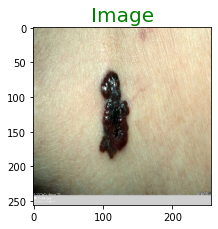

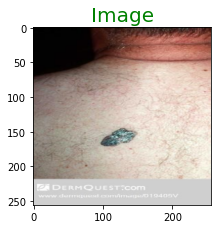

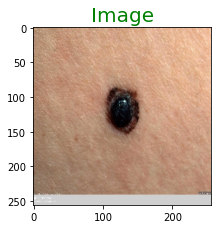

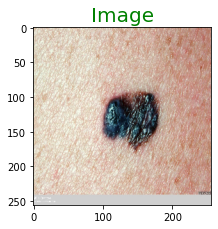

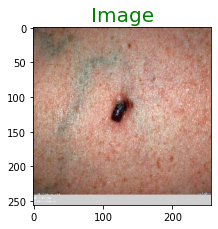

...

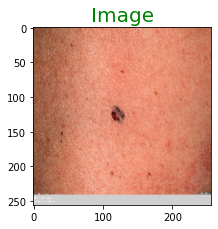

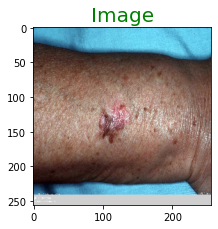

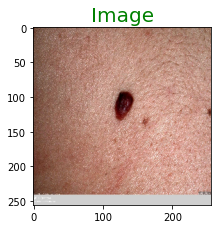

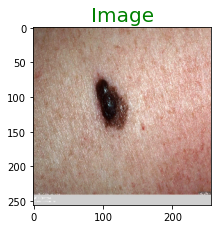

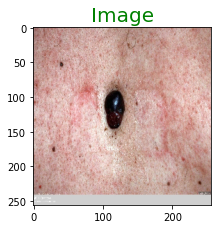

In [4]:
ls = [i for i in range(0,61,4)]
for i in ls:
    plot_images(img_array[i])

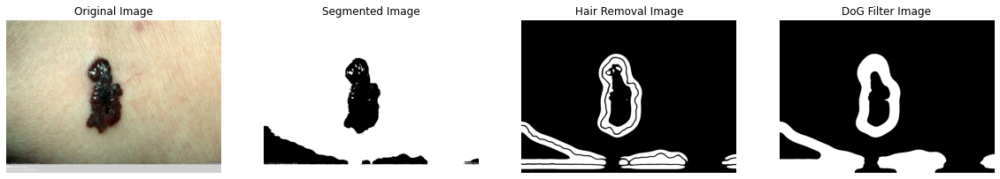

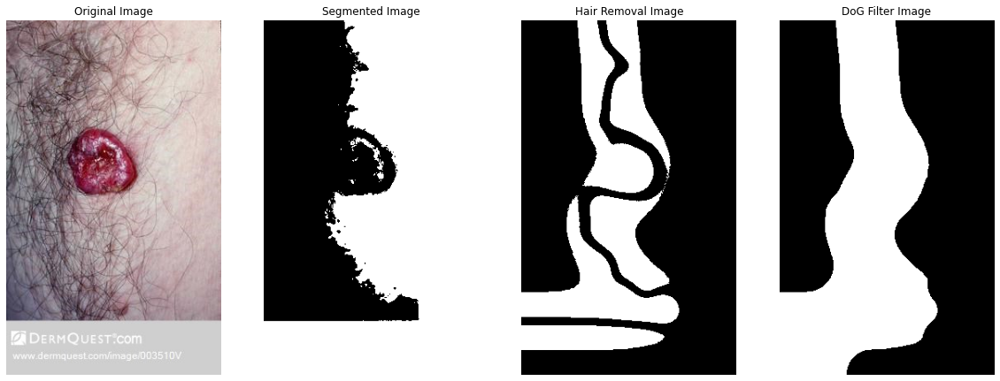

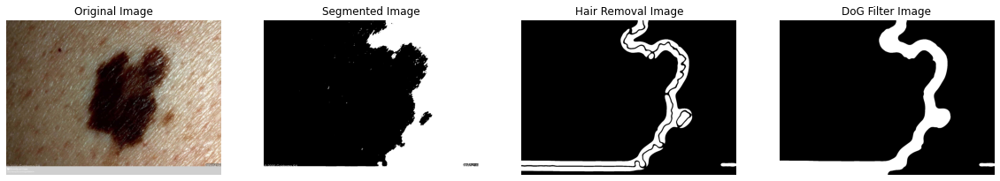

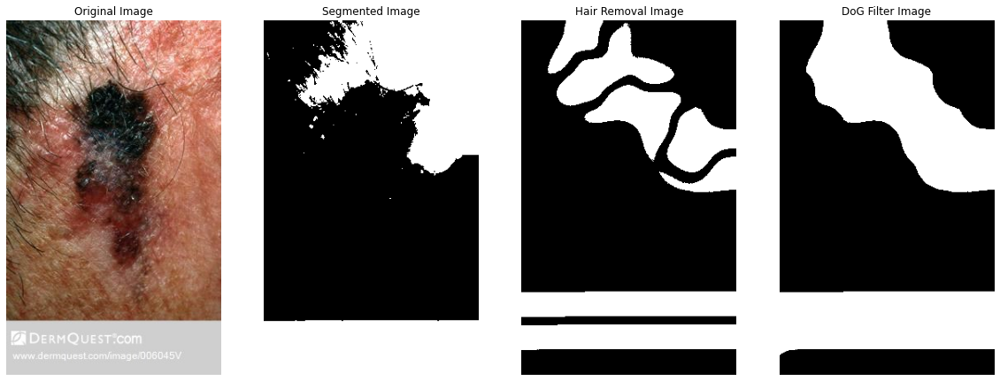

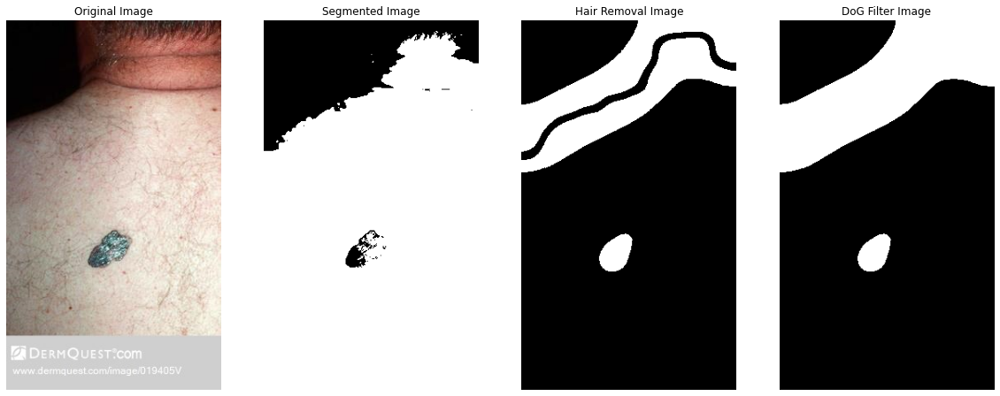

...

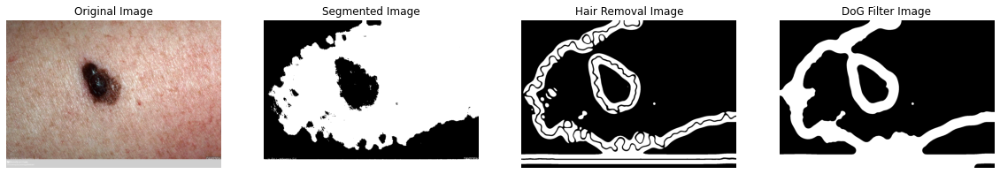

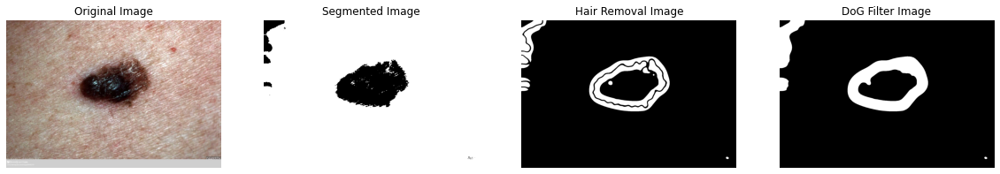

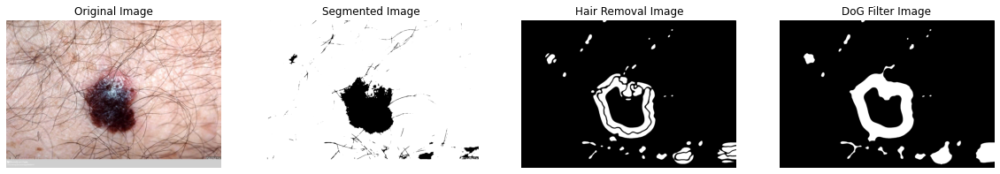

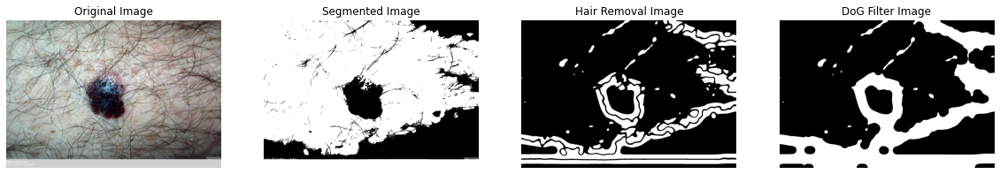

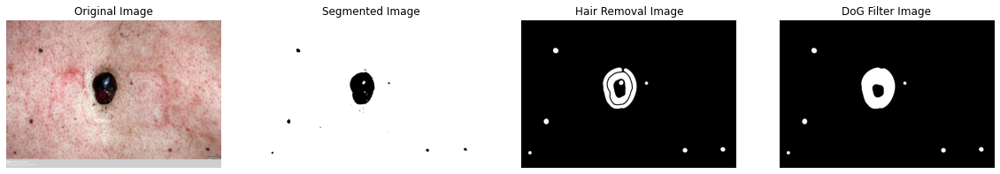

In [24]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the directory containing the images
image_path = "SkinTumorImages"

# Define the kernel for morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

# Define the sigma values for the difference of Gaussians filter
sigma1, sigma2 = 10, 30

# Loop through each image in the directory
for i, filename in enumerate(glob.glob(os.path.join(image_path, '*.jpg'))):
    # Read in the image
    img = cv2.imread(filename)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply mean shift
    shifted = cv2.pyrMeanShiftFiltering(img, 21, 51)

    # Convert the shifted image to grayscale
    gray_shifted = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)

    # Apply thresholding
    _, thresh = cv2.threshold(gray_shifted, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Apply the difference of Gaussians (DoG) filter
    gauss1 = cv2.GaussianBlur(thresh, (0, 0), sigmaX=sigma1, sigmaY=sigma1)
    gauss2 = cv2.GaussianBlur(thresh, (0, 0), sigmaX=sigma2, sigmaY=sigma2)
    dog = cv2.absdiff(gauss1, gauss2)

    # Define the rolling ball structuring element for morphological closing operation
    radius = 30
    selem = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*radius+1, 2*radius+1), (radius, radius))

    # Convert the image to binary using Otsu's method
    _, binary = cv2.threshold(dog, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # Perform a morphological closing operation with the rolling ball
    hair_removal = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, selem)

    # Create a figure with 1 row and 4 columns
    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 10))

    # Plot the original image
    axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Plot the DoG filter image
    axs[3].imshow(hair_removal, cmap='gray')
    axs[3].set_title('DoG Filter Image')
    axs[3].axis('off')

    # Plot the hair removal image
    axs[2].imshow(binary, cmap='gray')
    axs[2].set_title('Hair Removal Image')
    axs[2].axis('off')

    
    
    # Plot the segmented image
    axs[1].imshow(thresh, cmap='gray')
    axs[1].set_title('Segmented Image')
    axs[1].axis('off')

    # Show the figure
    plt.show()
    
    # Save the segmented image
     #Define the path to save segmented images
    segmented_path = "Segmentedimages"
    segmented_image_path = os.path.join(segmented_path, filename)
    cv2.imwrite(segmented_image_path, opening)


In [7]:
import os
import cv2

# Set the paths for the segmented images and the output masks
segmented_path = 'segmented_images'
mask_path = 'binary_masks'
 

# Set a fixed threshold value
threshold_value = 128

# Iterate over the files in the input directory
for filename in os.listdir(segmented_path):
    # Check if the file is an image (has a valid image extension)
    if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
        continue
    
    # Load the segmented image as grayscale
    segmented_image = cv2.imread(os.path.join(segmented_path, filename), cv2.IMREAD_GRAYSCALE)
    
    # Create the binary mask
    binary_mask = cv2.threshold(segmented_image, threshold_value, 255, cv2.THRESH_BINARY)[1]
    
    # Set the filename for the output mask
    mask_filename = os.path.splitext(filename)[0] + '_mask.png'
    
    # Save the binary mask to disk in the output directory
    try:
        cv2.imwrite(os.path.join(mask_path, mask_filename), binary_mask)
    except cv2.error as e:
        print(f"Error saving {mask_filename}: {e}")


In [8]:
import os
import cv2
import numpy as np

# Set the path to the ground truth masks and binary masks
gt_path = 'ground_mask'
binary_path = 'binary_masks'

# Create lists of filenames for the ground truth masks and binary masks
gt_filenames = sorted(os.listdir(gt_path))
binary_filenames = sorted(os.listdir(binary_path))

# Check that the number of filenames is the same for both lists
assert len(gt_filenames) == len(binary_filenames)

# Initialize a list to store the IoUs
ious = []

# Loop over each pair of masks
for gt_filename, binary_filename in zip(gt_filenames, binary_filenames):
    # Load the ground truth mask and the binary mask
    gt_mask = cv2.imread(os.path.join(gt_path, gt_filename), cv2.IMREAD_GRAYSCALE)
    binary_mask = cv2.imread(os.path.join(binary_path, binary_filename), cv2.IMREAD_GRAYSCALE)

    # Threshold the masks to convert them to binary masks
    threshold_value = 128
    gt_mask = cv2.threshold(gt_mask, threshold_value, 255, cv2.THRESH_BINARY)[1]
    binary_mask = cv2.threshold(binary_mask, threshold_value, 255, cv2.THRESH_BINARY)[1]

    # Calculate the intersection and union of the masks
    intersection = np.logical_and(gt_mask, binary_mask)
    union = np.logical_or(gt_mask, binary_mask)

    # Calculate the IoU
    iou = np.sum(intersection) / np.sum(union)
    
    # Add the IoU to the list
    ious.append(iou)

# Calculate the average IoU
average_iou = np.mean(ious)

print(f"Average IoU: {average_iou}")


Average IoU: 0.6792618671418665


In [9]:
import os
import cv2
import numpy as np

# Set the paths to the mask1 and mask2 folders
mask1_path = 'ground_mask'
mask2_path = 'binary_masks'

# Initialize the list of Dice coefficients
dice_coeffs = []

# Loop over all files in the mask1 folder
for filename in os.listdir(mask1_path):

    # Read the images from disk
    mask1 = cv2.imread(os.path.join(mask1_path, filename), cv2.IMREAD_GRAYSCALE)
    mask2 = cv2.imread(os.path.join(mask2_path, filename), cv2.IMREAD_GRAYSCALE)

    # Check if the images were successfully loaded
    if mask1 is None or mask2 is None:
        print(f"Failed to load masks for file {filename}")
        continue

    # Normalize the pixel values to either 0 or 1
    mask1 = mask1 / 255
    mask2 = mask2 / 255

    # Calculate the Dice coefficient and append it to the list
    intersection = np.sum(mask1 * mask2)
    union = np.sum(mask1) + np.sum(mask2)
    dice_coeff = 2 * intersection / union
    dice_coeffs.append(dice_coeff)

# Calculate the average Dice coefficient
avg_dice_coeff = np.mean(dice_coeffs)

print(f"Average Dice coefficient: {avg_dice_coeff}")


Average Dice coefficient: 0.7974909150637021
